# Boring Insect Detection with Machine Learning
In this notebook, we will give a brief summary of the work that has gone into our project, and we will give a demonstration of current results. 

## The Data
We have collected 30s clips of audio data from an infested tree located at Riordan Mansion, as well as from a seemingly healthy tree located outside of the Forestry building. We will begin by giving an example of an audio clip which was taken from the field as well as one taken in a lab setting. 

In [1]:
import numpy as np
import pandas as pd
import torch
import torchaudio as ta
from IPython.display import Audio
import matplotlib.pyplot as plt

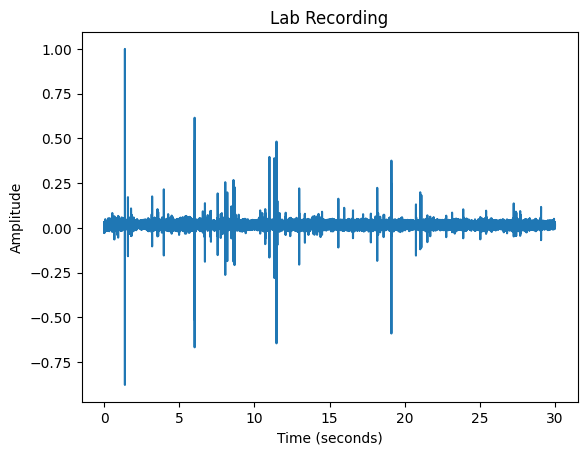

In [6]:
lab_audio_path = r"C:\Users\jeffu\Documents\Recordings\07_25_2024_LAB\2024-07-25_09_58_41.wav"
riordan_audio_path = r"C:\Users\jeffu\Documents\Recordings\06_27_2024_R1\2024-06-24_15_00_26.wav"

y_lab, fs = ta.load(lab_audio_path)
y_lab = y_lab/y_lab.max()
y_r, fs = ta.load(riordan_audio_path)
y_r = y_r/y_r.max()

t = np.arange(y_lab.shape[1])/fs

plt.plot(t,y_lab[0].numpy())
plt.title('Lab Recording')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.show()
Audio(y_lab, rate = fs)



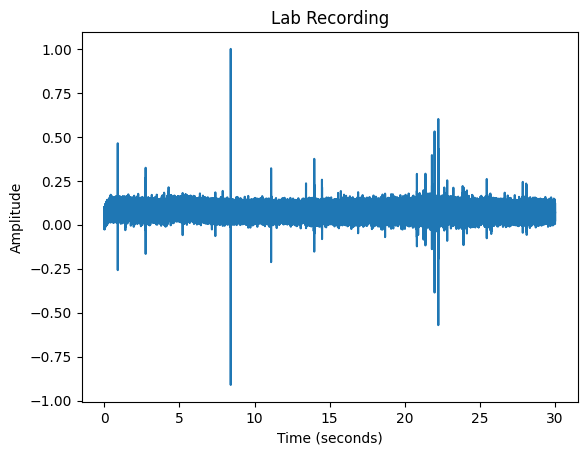

In [7]:
plt.plot(t,y_r[0].numpy())
plt.title('Relatively Clean Field Recording')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.show()
Audio(y_r, rate = fs)

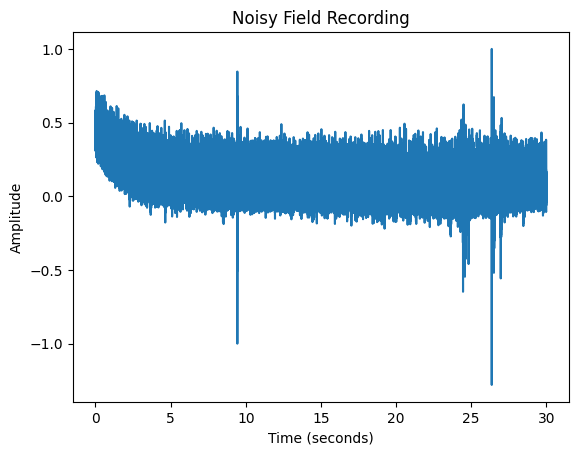

In [22]:
noisy_path = r"C:\Users\jeffu\Documents\Ash Borer Project\Datasets\validation_recordings - Copy\Clip 1.wav"
y_noisy,fs_noisy = ta.load(noisy_path)
y_noisy = y_noisy[0]/y_noisy[0].max()
t_noisy = np.arange(len(y_noisy))/fs_noisy

plt.plot(t_noisy,y_noisy.numpy())
plt.title('Noisy Field Recording')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')

Audio(y_noisy, rate = fs_noisy)


## Visualizing Chewing Noises and False Positives

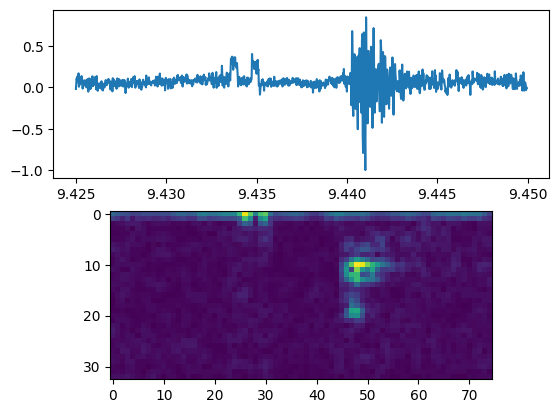

In [30]:
start = int(9.425*fs_noisy)
end = int(9.45*fs_noisy)

clip = y_noisy[start:end]
t_clip = t_noisy[start:end]
trans = ta.transforms.Spectrogram(n_fft = 64, hop_length = 16, power = 1)
spec = trans(clip)

fig, ax = plt.subplots(2,1)
ax[0].plot(t_clip,clip.numpy())
ax[1].imshow(spec)

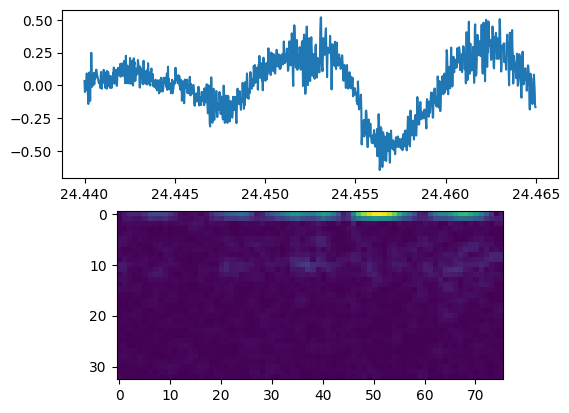

In [36]:
start = int(24.44*fs_noisy)
end = int(24.465*fs_noisy)

clip = y_noisy[start:end]
t_clip = t_noisy[start:end]
trans = ta.transforms.Spectrogram(n_fft = 64, hop_length = 16, power = 1)
spec = trans(clip)

fig, ax = plt.subplots(2,1)
ax[0].plot(t_clip,clip.numpy())
ax[1].imshow(spec)

## Detecting Chewing Noises with Machine Learning

In [42]:
import time
from scipy.signal import butter, filtfilt
import torch.nn as nn
import soundfile as sf 
import sounddevice as sd 

FORMAT = None
CHANNELS = 1
RATE = 48000
CHUNK = int(RATE * 0.05) 

class CNNNetwork(nn.Module):

    def __init__(self):
        super().__init__()
        self.conv1=nn.Sequential(
            nn.Conv2d(in_channels=1,out_channels=16,kernel_size=3,stride=1,padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv2=nn.Sequential(
            nn.Conv2d(in_channels=16,out_channels=32,kernel_size=3,stride=1,padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv3=nn.Sequential(
            nn.Conv2d(in_channels=32,out_channels=64,kernel_size=3,stride=1,padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv4=nn.Sequential(
            nn.Conv2d(in_channels=64,out_channels=128,kernel_size=3,stride=1,padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv5=nn.Sequential(
            nn.Conv2d(in_channels=128,out_channels=256,kernel_size=3,stride=1,padding=2),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.flatten=nn.Flatten()
        self.linear1=nn.Linear(in_features=3072,out_features=128)
        self.linear2=nn.Linear(in_features=128,out_features=1)
        self.output=nn.Sigmoid()
    
    def forward(self,input_data):
        x=self.conv1(input_data)
        x=self.conv2(x)
        x=self.conv3(x)
        x=self.conv4(x)
        x=self.conv5(x)
        x=self.flatten(x)
        x=self.linear1(x)
        logits=self.linear2(x)
        output=self.output(logits)
        
        return output



def bandpass_filter(data,fs, lowcut=1000, highcut=12000, order=5, pad = 0):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    y = filtfilt(b,a,data, padlen=pad)
    return y

def chunk_to_spec(audio_chunk):
    transform = ta.transforms.MelSpectrogram(sample_rate=48000,n_fft=64,hop_length=16,f_min = 1000, f_max = 12000,n_mels=16)
    y = transform(audio_chunk)
    return y

def classify_chunk(model,audio_chunk):
    spec = chunk_to_spec(audio_chunk)
    with torch.no_grad():
        output = model(spec)
        pred =  (output>=0.5)*1
        del output, spec 
    return pred.item()

def simulate_real_time_classification(model,wav_file, duration = 30):
    audio_data, sr = ta.load(wav_file)
    y,fs = sf.read(wav_file)
    y = y/np.max(np.abs(y))
    sd.play(y,fs)
    if audio_data.shape[0] > 1:
        audio_data = audio_data[0,:].reshape(1,-1)
    
    if sr != 48000:
        resampler = ta.transforms.Resample(sr,48000)
        audio_data = resampler(audio_data)
        sr = 48000

    
    num_chunks = int(duration * 1000/50)
    times_list = []
    
    
    try:
        for i in range(num_chunks):
            start_idx = i*CHUNK
            end_idx = start_idx + CHUNK
            if end_idx > audio_data.shape[1]:
                break
            audio_chunk = audio_data[:,start_idx:end_idx]
            audio_chunk = audio_chunk/audio_chunk.max()
            audio_chunk = bandpass_filter(audio_chunk,sr)
            audio_chunk = torch.from_numpy(audio_chunk.astype('f'))
            audio_chunk = audio_chunk.unsqueeze(0)
            pred = classify_chunk(model,audio_chunk)
            
            if pred== 1:
                times_list.append((start_idx,end_idx))
                print(f'Event Detected at {int(start_idx/sr)} seconds')
            
            time.sleep(0.05)
    except KeyboardInterrupt:
        print('Simulation Interrupted')
    finally:
        print('Simulation Complete')
    return times_list

Event Detected at 9 seconds
Event Detected at 26 seconds
Simulation Complete


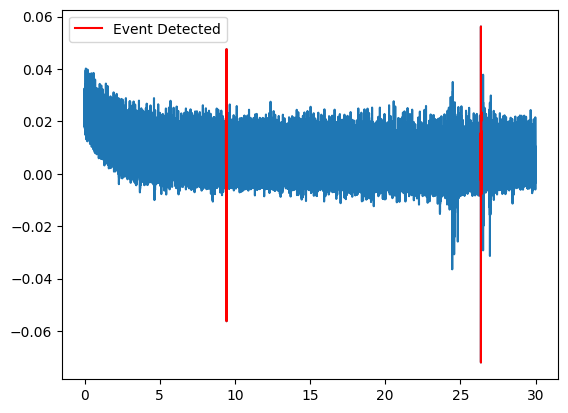

In [44]:
import warnings
warnings.filterwarnings("ignore")
model = CNNNetwork()
model.load_state_dict(torch.load(r"C:\Users\jeffu\Documents\Ash Borer Project\models\Current_Best_2D.pt"))
wav_file = noisy_path
times = simulate_real_time_classification(model,wav_file, duration=30)
y, fs = ta.load(wav_file)

if fs != 48000:
    resampler = ta.transforms.Resample(fs,48000)
    y = resampler(y)
    fs = 48000
y = y.numpy()
y = y[0,:]
t = np.arange(len(y))/fs
plt.plot(t,y)
for i, (start,end) in enumerate(times):
    t_clip = t[start:end]
    clip = y[start:end]
    if i== 0:
        plt.plot(t_clip,clip,'r', label='Event Detected')
        
    else:
        plt.plot(t_clip,clip,'r')
plt.legend()
plt.show() 